# Большая лабораторная

## Постановка задачи

Пользователь на вход алгоритма даёт фотографию, на которой есть только стул и дверной проём. 

Алгоритм должен уметь определять по фотографии, можно ли стул поступательным движением пронести через дверной проём (т.е дать ответ "да" / "нет").
 
Опциональная задача для алгоритма:
 - указать, на сколько градусов надо повернуть стул, чтобы он стал пролезать через дверной проем.
 
## Требования к входным данным
 
Входные изображения пользователя должны соответствовать следующим требованиям:
 
- Формат jpg
- На фотографиях есть только стул и дверной проём. Наличие других предметов крайне нежелательно.
- Стул и дверь должны целиком влезать в кадр
- Фотографии должны быть сделаны при хорошем освещении
- Наличие большого числа теней нежелательно

## План
 
### Выделение контуров

0. Предобработать изображение с помощью бинаризации, морфологических функций.

1. Попробовать метод Канни для нахождения границ стула и дверного проёма. Сначала можно попробовать более простую задачу: дать на вход алгоритма фотографии, на которых есть только стул (без проёма) и фотографии, где есть только дверной объем (без стула). Если получится выделить контур стула и проёма, то можно будет перейти к более сложной задаче, где стул и проём находятся на одной фотографии и при этом пересекаются.
 
2. Пункт 1 попробовать методом Хафа для поиска прямых. 
 
3. Попробовать найти углы дверного проёма и изгибы стула с помощью угловых детекторов
 
4. Попробовать сопоставление найденных контуров с заранее заданным шаблоном стула и дверного проёма.
 
### Анализ полученных данных
 
1. Определить геометрические размеры объектов на основе п.1) и данных пользователя
 
2. Дать ответ на вопрос: "можно ли стул поступательным движением перенести через дверной проем?"
 
3. (*) Определить, на какой угол стул нужно повернуть, чтобы он прошел через проем.

## Загрузка данных

Выведем на экран 5 фотографий, для которых должен быть ответ "да" и столько же фотографий с ответом "нет":

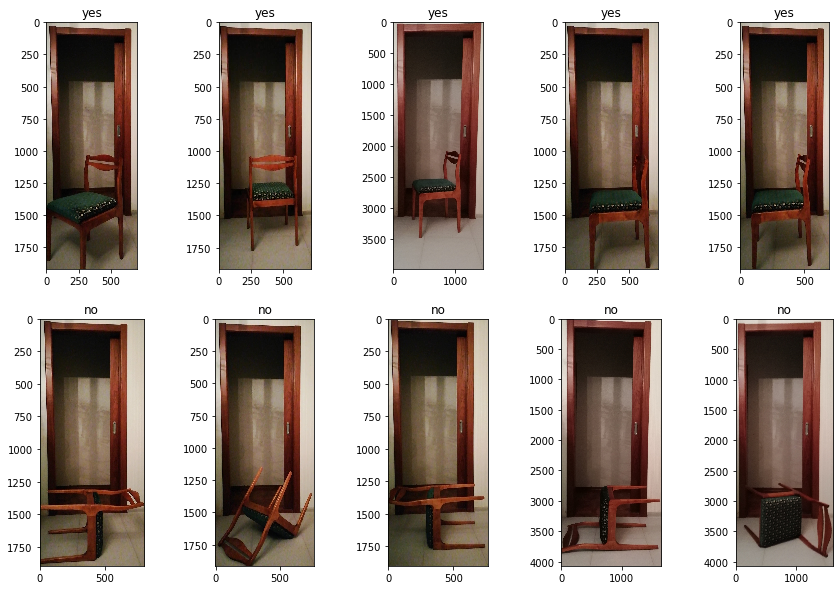

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from imageio import imread, imsave

directory = "data/test/"
fig, ax = plt.subplots(2, 5, figsize=(15, 10))
images_yes = []
images_no  = []

for i in range(1 * 5):
    label = "yes"
    filename = str(i + 1) + ".jpg"
    path = directory + label + "/" + filename
    images_yes.append(imread(path))
    ax.flatten()[i].set_title(label)
    ax.flatten()[i].imshow(images_yes[i])

for i in range(1 * 5):
    label = "no"
    filename = str(i + 1) + ".jpg"
    path = directory + label + "/" + filename
    images_no.append(imread(path))
    ax.flatten()[i + 5].set_title(label)
    ax.flatten()[i + 5].imshow(images_no[i])

Также загрузим фотографии стула без дверного проёма:

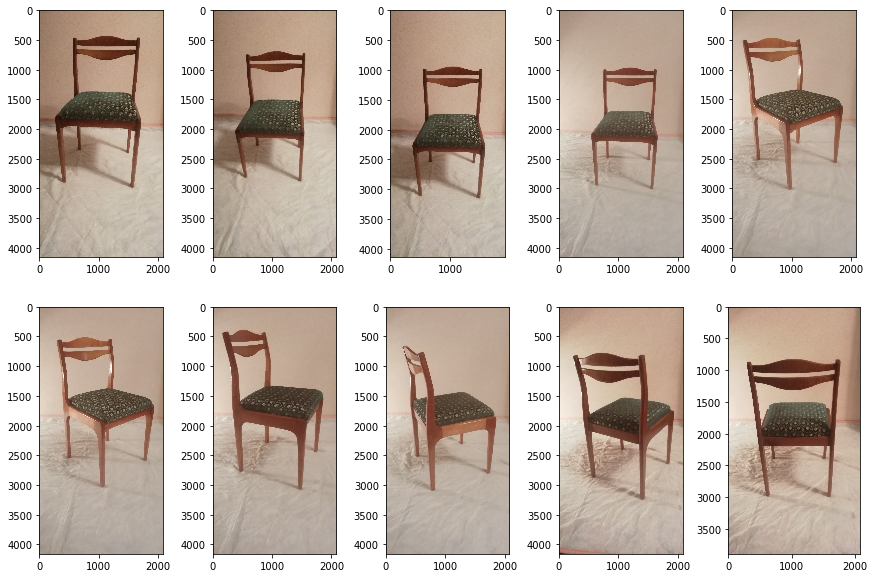

In [2]:
directory = "data/single_chair/"
fig, ax = plt.subplots(2, 5, figsize=(15, 10))
single_chair = []

for i in range(2 * 5):
    path = directory + str(i + 1) + ".jpg"
    single_chair.append(imread(path))
    ax.flatten()[i].imshow(single_chair[i])

Теперь загрузим фотографию дверного проёма без стула:

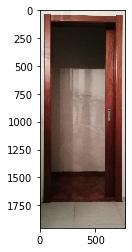

In [3]:
door = imread("data/single_door/1.jpg")
plt.imshow(door)

## Метод Канни

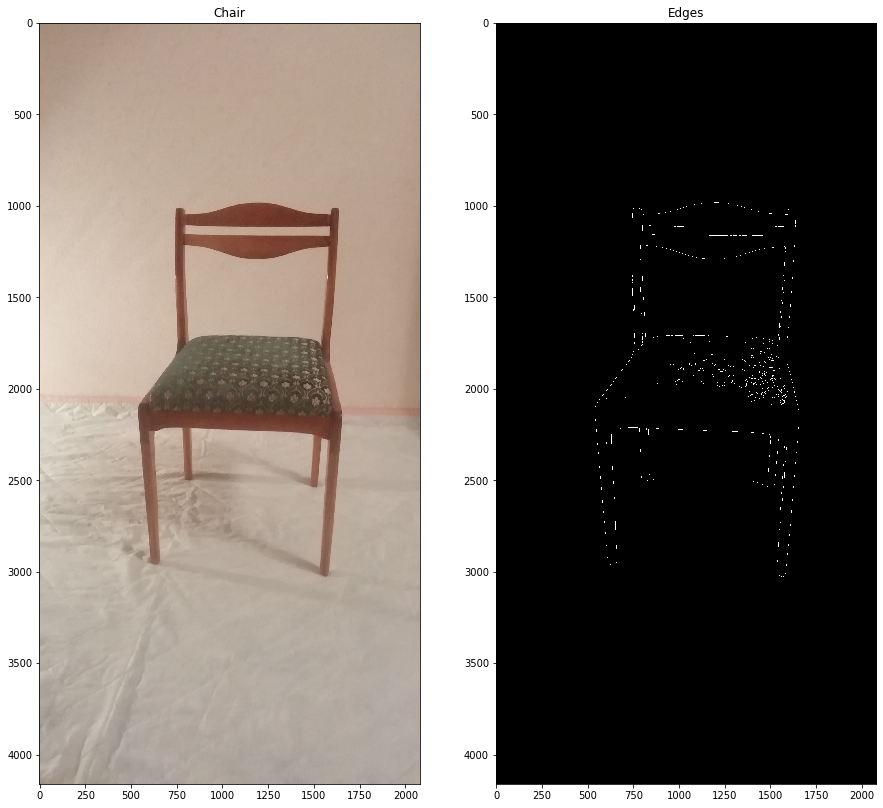

In [4]:
from skimage.feature import canny
from skimage.filters import sobel, gaussian
from skimage.color import rgb2gray

chair = single_chair[3]
chair_gray = rgb2gray(chair)

chair_edges = canny(chair_gray, sigma=2)

f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].set_title("Chair")
ax[1].set_title("Edges")
ax[0].imshow(chair)
ax[1].imshow(chair_edges, cmap="gray")

Границы стула выделяются пусть и правильно, но слишком прерывисто. Попробуем предобработать изображение с помощью бинаризации:

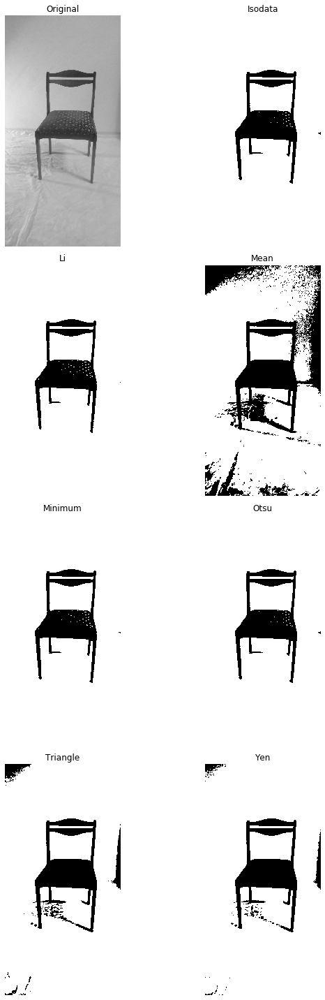

In [5]:
from skimage.filters import try_all_threshold
fig, ax = try_all_threshold(rgb2gray(chair), figsize=(10, 20), verbose=False)
plt.show()

Лучше всего получилось с фильтром Ли.

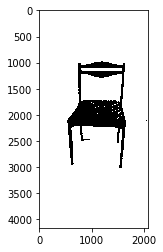

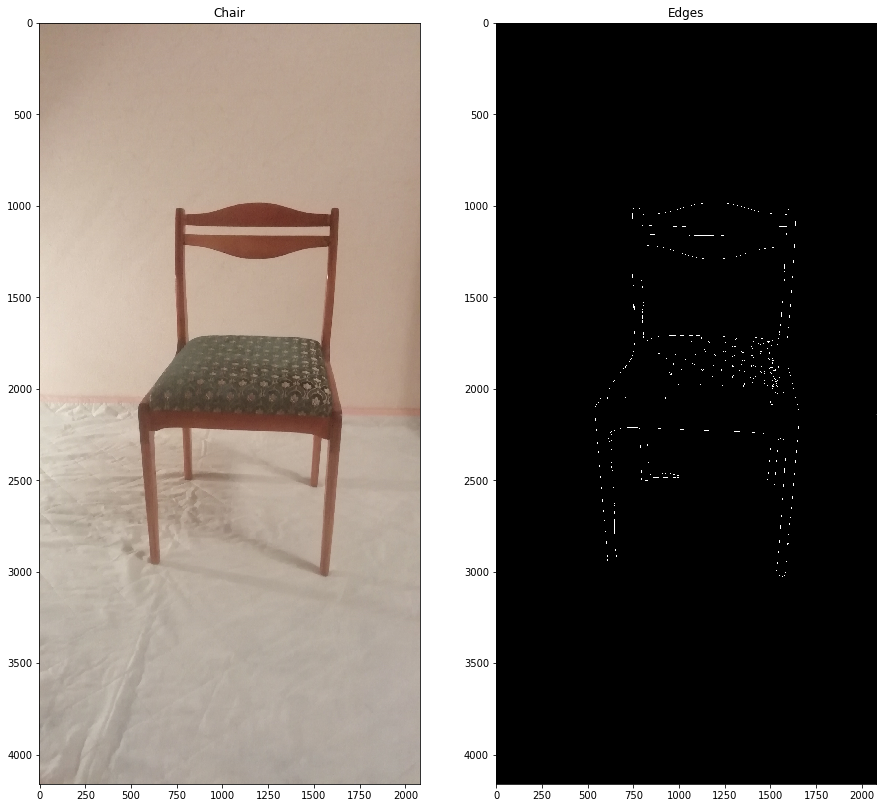

In [6]:
from skimage.filters import threshold_li

binary_chair_gray = rgb2gray(chair)
threshold = threshold_li(binary_chair_gray)

binary_chair = binary_chair_gray > threshold

plt.imshow(binary_chair, cmap='gray')
plt.show()

binary_chair_edges = canny(binary_chair, sigma=2)

f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].set_title("Chair")
ax[1].set_title("Edges")
ax[0].imshow(chair, cmap="gray")
ax[1].imshow(binary_chair_edges, cmap="gray")

Видим, что бинаризация не помогла.
Можно попробовать морфологические операции:

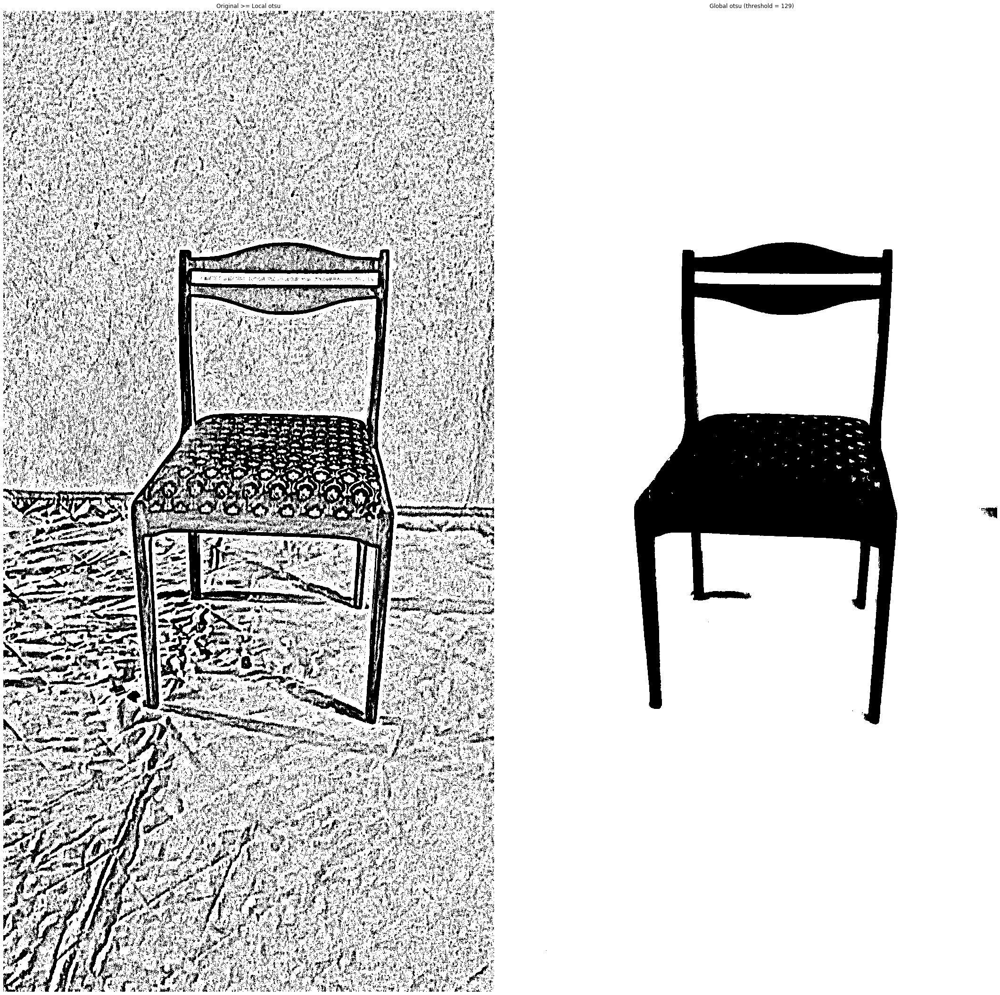

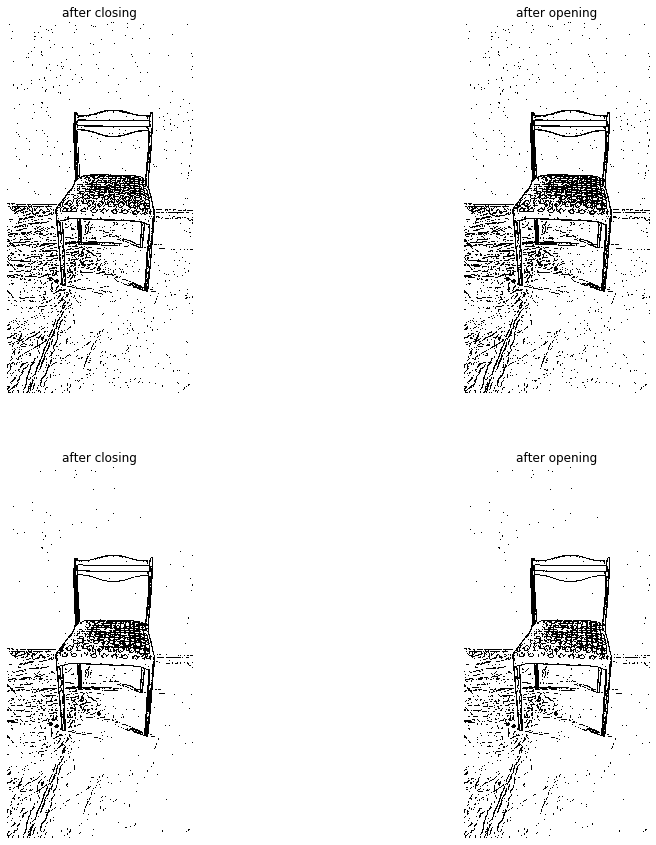

In [7]:
from skimage.util import img_as_ubyte
from skimage.morphology import disk
from skimage.morphology import binary_closing
from skimage.morphology import binary_opening
from skimage.filters import threshold_otsu, rank

data_img_gray = rgb2gray(chair)
img = img_as_ubyte(data_img_gray)
radius = 15
selem = disk(radius)
local_otsu = rank.otsu(img, selem)
threshold_global_otsu = threshold_otsu(img)
global_otsu = img >= threshold_global_otsu

fig, ax = plt.subplots(1, 2, figsize=(30, 30), sharex=True, sharey=True)
ax2, ax3 = ax.ravel()
plt.tight_layout()

img_local_otsu = img >= local_otsu
ax2.imshow(img_local_otsu, cmap=plt.cm.gray)
ax2.set_title('Original >= Local otsu' % threshold_global_otsu)
ax2.axis('off')

ax3.imshow(global_otsu, cmap=plt.cm.gray)
ax3.set_title('Global otsu (threshold = %d)' % threshold_global_otsu)
ax3.axis('off')

plt.show()

tmp_img = img_local_otsu

tmp_res_otsu_close = binary_closing(tmp_img, selem=np.ones((5, 5)))
tmp_res_otsu_open = binary_opening(tmp_res_otsu_close, selem=np.ones((7, 7)))


fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax0, ax1, ax2, ax3 = ax.ravel()
ax0.axis('off')
ax1.axis('off')
ax0.set_title("after closing")
ax1.set_title("after opening")
ax0.imshow(tmp_res_otsu_close, cmap="gray")
ax1.imshow(tmp_res_otsu_open, cmap="gray")


img_local_otsu_blur = gaussian(tmp_res_otsu_open, sigma=0.5, multichannel=True)

tmp_res_otsu_open_2 = binary_closing(img_local_otsu_blur, selem=np.ones((5, 5)))
tmp_res_otsu_close_2 = binary_opening(tmp_res_otsu_open_2, selem=np.ones((10, 10)))

ax2.axis('off')
ax3.axis('off')
ax2.set_title("after closing")
ax3.set_title("after opening")
ax2.imshow(tmp_res_otsu_close_2, cmap="gray")
ax3.imshow(tmp_res_otsu_open_2, cmap="gray")
plt.show()

img_res_otsu_morph = tmp_res_otsu_open

Всё же границы стула до применения бинаризации и морфологии можно считать приемлемыми для использования. Можно итерироваться по полученной матрице и найти ширину и высоту стула в пикселях. Затем, зная метрики, которые пользователь дал на вход, будет достаточно просто дать ответ на поставленный вопрос.
Но получится ли выделить стул с помощью фильтра Канни на более сложном входном изображении, где есть и стул, дверь, разнородный фон и тени?  

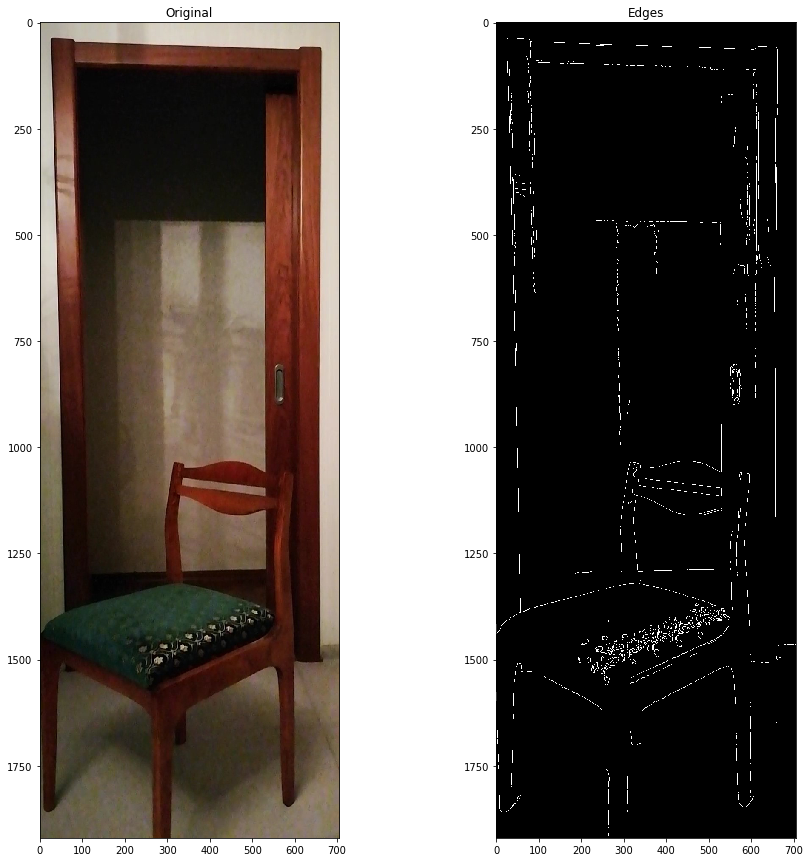

In [8]:
img = images_yes[0]
img_gray = rgb2gray(img)

img_edges = canny(img_gray, sigma=1)

f, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].set_title("Original")
ax[1].set_title("Edges")
ax[0].imshow(img)
ax[1].imshow(img_edges, cmap="gray")

Видно, что получилось выделить границы стула и дверного проёма. Но по матрице `img_edges` никак не определить, какие границы относятся к стулу, какие к двери, а какие - ни к тому, ни к другому. Так что метод Канни оставляем "в запасе"

## Выделение особых точек с помощью ORB детектора

Возьмём кадр, где есть только cтул, и найдём на нём особые точки. На втором кадре (стул + дверной проём) попробуем найти стул по особым точкам.

Шаблон стула обрежем так, чтобы стул заполнял всю картинку:

In [9]:
!pip install opencv-python

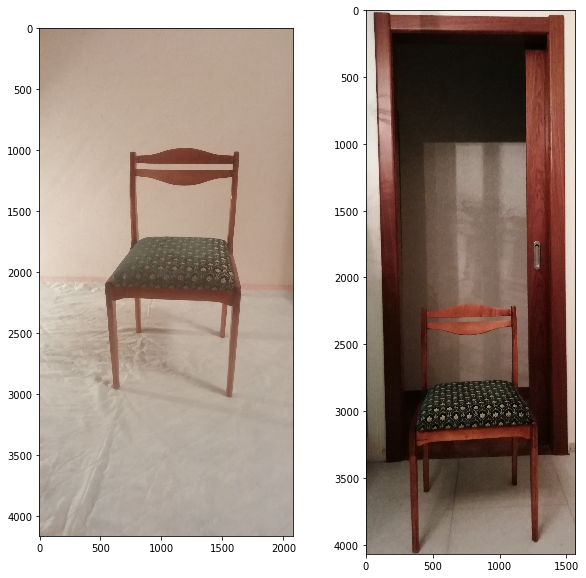

In [10]:
from skimage.filters import try_all_threshold
from skimage.filters import threshold_local

path1 = 'data/single_chair/4.jpg'
path2 = 'data/test/yes/11.jpg'

frame1 = imread(path1)
frame2 = imread(path2)

fig, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(frame1)
ax[1].imshow(frame2)

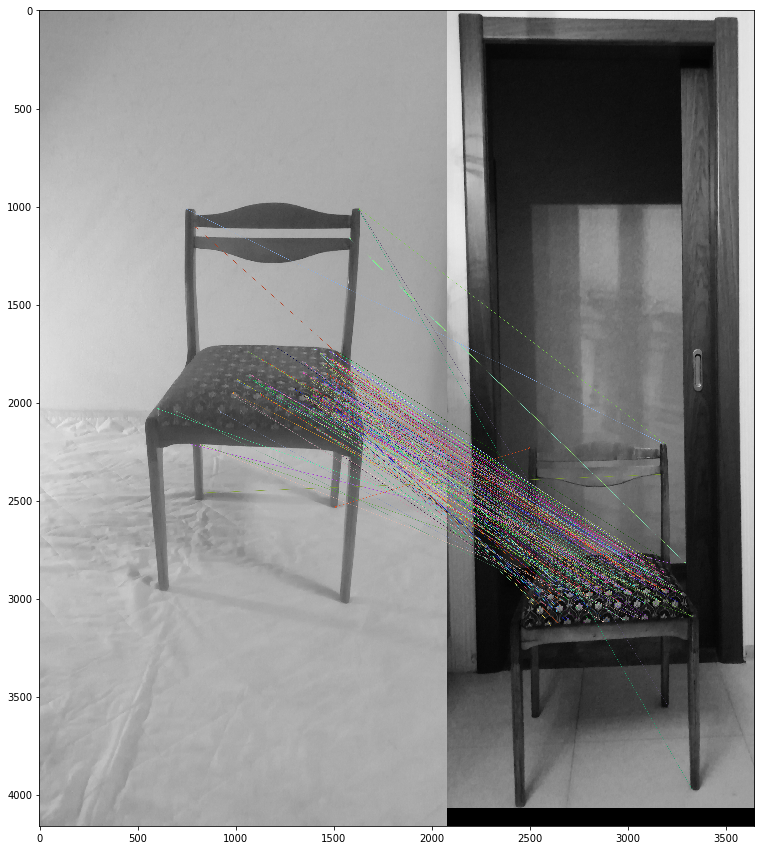

In [11]:
import cv2
from matplotlib.patches import Rectangle
from scipy.ndimage.morphology import binary_fill_holes
from skimage.morphology import watershed, binary_closing, binary_erosion, binary_opening
 
src = cv2.cvtColor(cv2.imread(path1) , cv2.COLOR_BGR2GRAY)
dst = cv2.cvtColor(cv2.imread(path2), cv2.COLOR_BGR2GRAY)

orb_detector = cv2.ORB_create(nfeatures=100000)
kp1, des1 = orb_detector.detectAndCompute(src, None)
kp2, des2 = orb_detector.detectAndCompute(dst, None)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = matcher.match(des1, des2)

matches = sorted(matches, key = lambda x:x.distance)

good_matches = []
for m in matches:
    if m.distance < 40:
        good_matches.append(m)
         
img_matches = cv2.drawMatches(src, kp1, dst, kp2, good_matches, None, 
                      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize = (15, 15))
plt.imshow(img_matches, interpolation='nearest')


plt.show()




Стул распознаётся правильно. 

Направления работы в дальнейшем:

1. Придумать, как автоматически выбирать наиболее подходящий шаблон стула для входной картинки
2. Используя данные, полученные в п.1, найти примерные геом. размеры стула
3. Придумать, как распознать дверь
4. Найти примерные геом. размеры двери
5. Дать ответ на задачу


Попробуем выбрать "наилучший" шаблон стула для входной картинки. Критерий - максимум "хороших" совпадений. Совпадения "хорошие", если метрика distance не превосходит порог.

С использованием выбранного шаблона попробуем посчитать ширину стула относительно ширины картинки.

chair template  1 matches:  1665
chair template  2 matches:  1551
chair template  3 matches:  2203
chair template  4 matches:  846
chair template  5 matches:  1516
chair template  6 matches:  1945
chair template  7 matches:  874
chair template  8 matches:  659
chair template  9 matches:  349
chair template  10 matches:  1001
chair template  11 matches:  1136
chair template  12 matches:  94
chair template  13 matches:  325
chair template  14 matches:  414


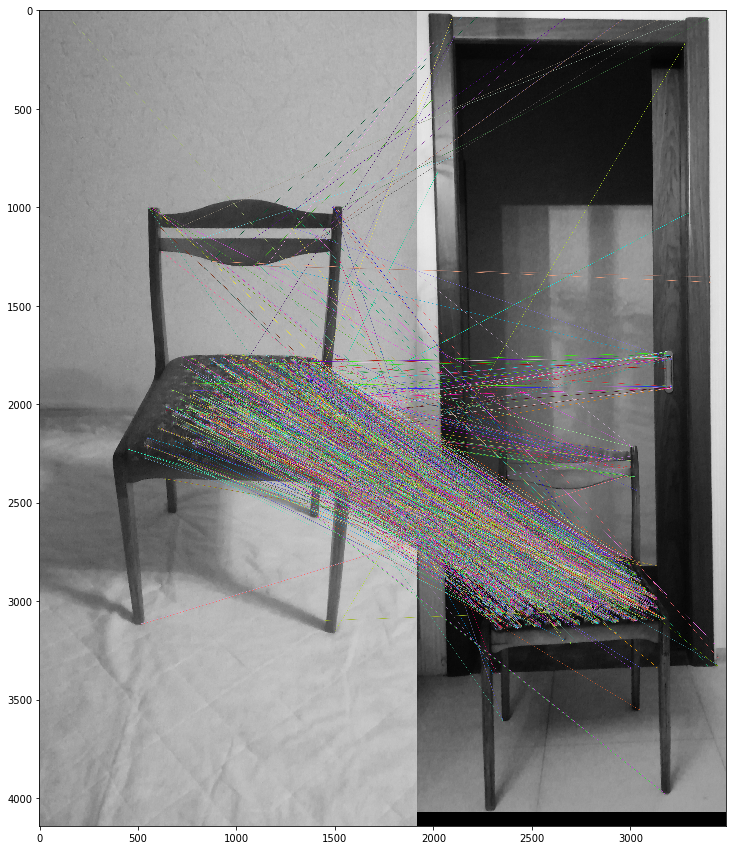

Best path is:  data/single_chair/3.jpg
chair width:  0.8846939242615992


In [12]:
def try_all_templates(dst, output_info, output_graphics, figsize, threshold, templates_total, templates_path):
    max_good_matches = 0
    best_path = "/null"
    best_matches = []
    kp1_best = []
    kp2_best = []
    
    for n in range(1, templates_total + 1):
        path1 = templates_path + str(n) + ".jpg"
        src = cv2.cvtColor(cv2.imread(path1), cv2.COLOR_BGR2GRAY)
    
        orb_detector = cv2.ORB_create(nfeatures=10000)
        kp1, des1 = orb_detector.detectAndCompute(src, None)
        kp2, des2 = orb_detector.detectAndCompute(dst, None)

        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = matcher.match(des1, des2)

        good_matches = []
        good_matches_total = 0
        for m in matches:
            if m.distance <= threshold:
                good_matches.append(m)
                good_matches_total += 1
                
        if output_info:
            print("chair template ", n, "matches: ", good_matches_total)
    
        if good_matches_total > max_good_matches:
            max_good_matches = good_matches_total
            best_matches = good_matches
            best_path = path1
            kp1_best = kp1
            kp2_best = kp2
    
    #if max_good_matches < threshold:
        #print("WARNING: too less marker-points. Trying again with higher threshold...")
        #try_all_templates(dst, output_info, output_graphics, figsize, threshold + 5, templates_total, templates_path)
    #else: 
    src = cv2.cvtColor(cv2.imread(best_path), cv2.COLOR_BGR2GRAY)
    img_matches = cv2.drawMatches(src, kp1_best, dst, kp2_best, best_matches, None, 
                          flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        
    if output_graphics:
        plt.figure(figsize = (figsize, figsize))
        plt.imshow(img_matches, interpolation='nearest')
        plt.show()
        
    if output_info:   
        print("Best path is: ", best_path)
            
    
    x_list = []
    
    for mat in best_matches:
        img1_idx = mat.queryIdx
        img2_idx = mat.trainIdx
        (x1, y1) = kp1_best[img1_idx].pt
        (x2, y2) = kp2_best[img2_idx].pt  
      
        chair_ratio = 0.45 # знаем, что стул находится примерно в нижней части картинки
        y_up = (1 - chair_ratio) * dst.shape[0]
        
        if y2 > y_up:
            x_list.append(x2)

    x_list.sort()


    x_min = x_list[0]
    x_max = x_list[len(x_list) - 1]
    #print(x_min / dst.shape[1], x_max / dst.shape[1])

    
    w = (x_max - x_min) / dst.shape[1]
    return w
    
    
path2 = 'data/test/yes/11.jpg'
dst = cv2.cvtColor(cv2.imread(path2), cv2.COLOR_BGR2GRAY)
w = try_all_templates(dst, output_info=True, output_graphics=True,
                      figsize=15, threshold=200, templates_total=14, templates_path="data/single_chair/")
print("chair width: ", w)

Эксперимент удался! Но что будет для другой входной картинки?

test № 1


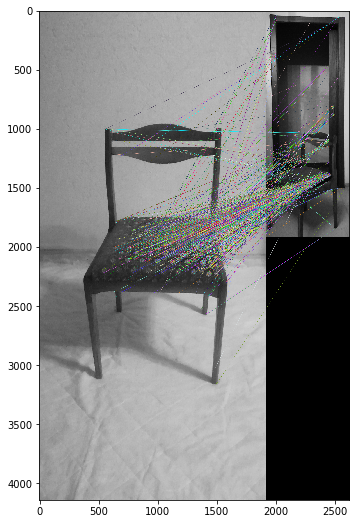

chair width:  0.8619914819162788
test № 2


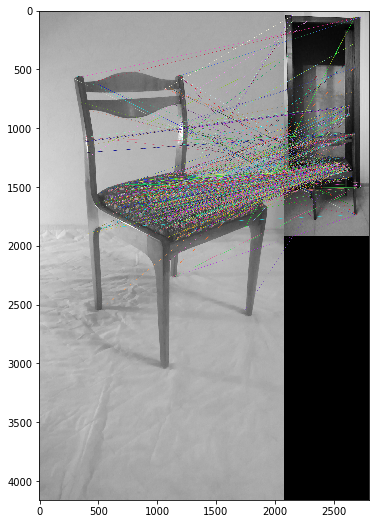

chair width:  0.5919737111891212
test № 3


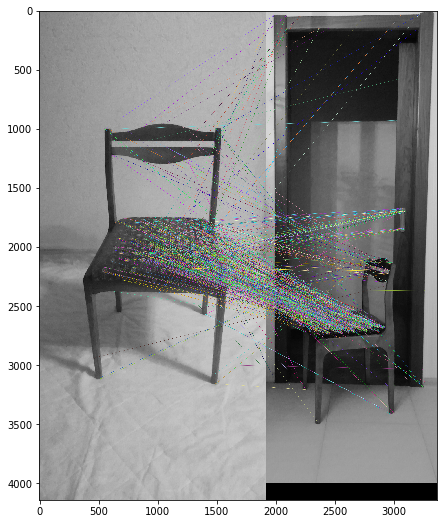

chair width:  0.8911479934122553
test № 4


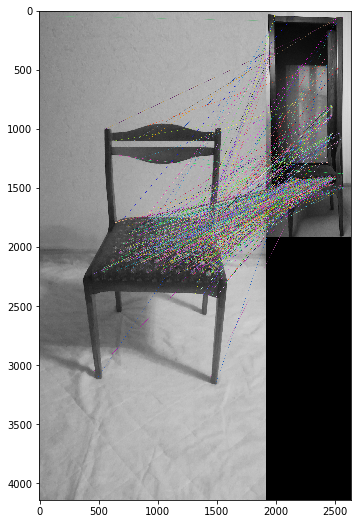

chair width:  0.6235784141762742
test № 5


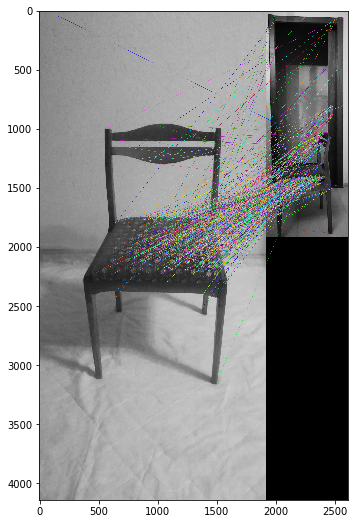

chair width:  0.7919629286063563


In [13]:
sample_size_yes = 5 
for n in range(1, sample_size_yes + 1):
    path2 = "data/test/yes/" + str(n) + ".jpg"
    dst = cv2.cvtColor(cv2.imread(path2), cv2.COLOR_BGR2GRAY)
    print("test №", n)
    w = try_all_templates(dst, output_graphics=True, output_info=False, 
                          figsize=9, threshold = 200, templates_total = 14, templates_path = "data/single_chair/")
    print("chair width: ", w)
    

Конечно, далёко не идеально получилось. Однако по картинкам видно, что в принципе во всех 5 случаях можно узнать примерную ширину стула (особенно зная, что он находится внизу картинки). Это и нужно в задаче. Стул по высоте обязан пролезать в проём.

Надо ещё посмотреть для картинок с ответом "no":

test № 1


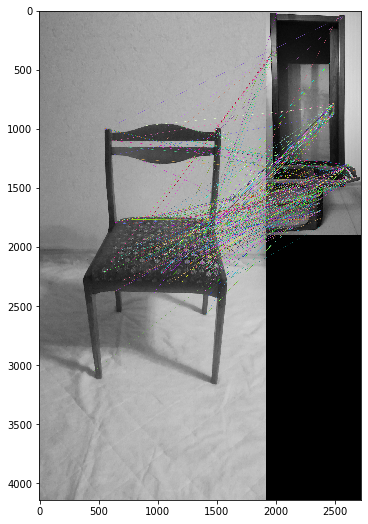

chair width:  0.8929675761006419
test № 2


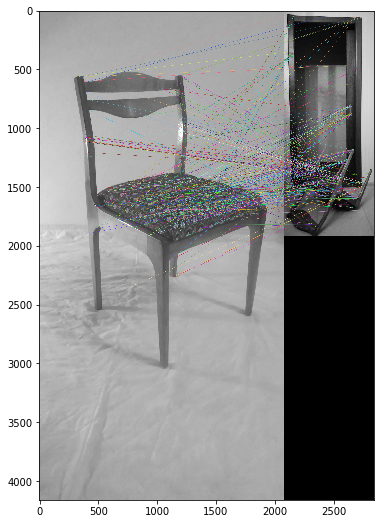

chair width:  0.8539348040286068
test № 3


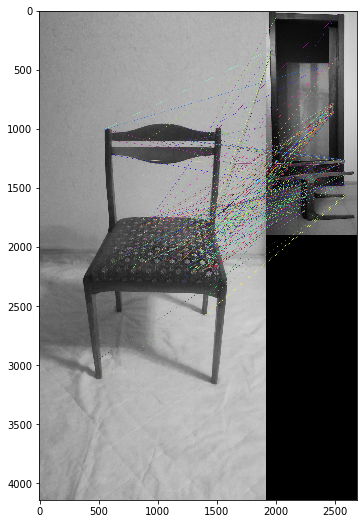

chair width:  0.8177083333333334
test № 4


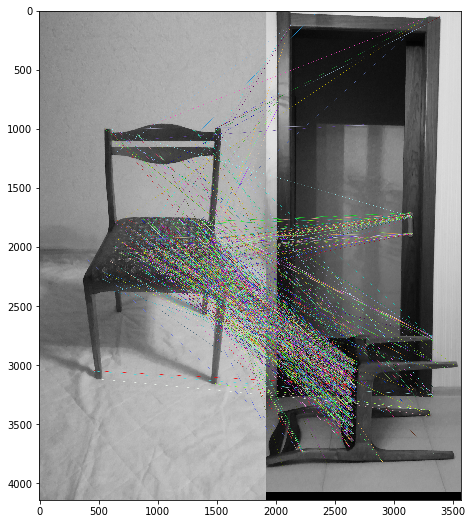

chair width:  0.9527845036319612
test № 5


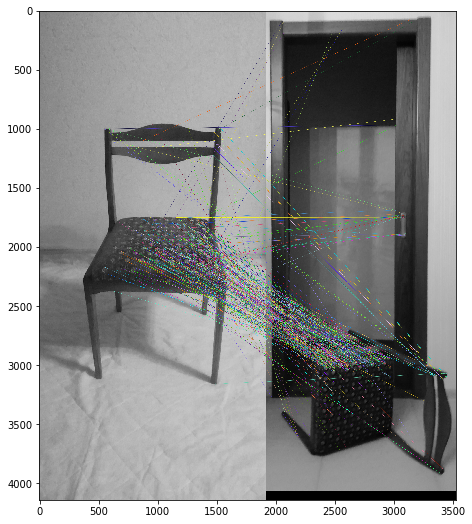

chair width:  0.9181127459310907


In [14]:
sample_size_no = 5 
for n in range(1, sample_size_no + 1):
    path2 = "data/test/no/" + str(n) + ".jpg"
    dst = cv2.cvtColor(cv2.imread(path2), cv2.COLOR_BGR2GRAY)
    print("test №", n)
    w = try_all_templates(dst, output_info=False, output_graphics = True, figsize=9, threshold = 200, templates_total = 14, templates_path = "data/single_chair/")
    print("chair width: ", w)
    


В целом для картинок с ответом "no" ширина стула получается больше, чем для картинок с ответом "yes". Примерно этого и хотелось.

Теперь можно попробовать распознать дверь тем же способом:

test № 1


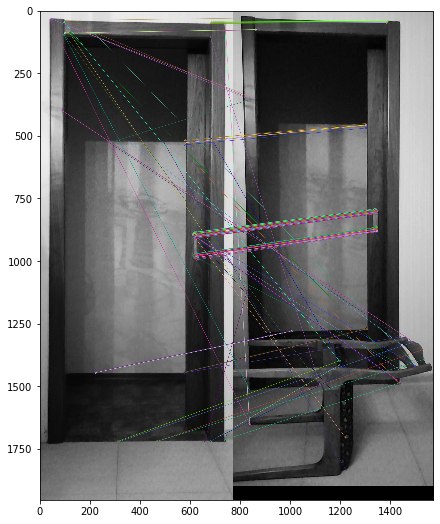

In [15]:
sample_size_no = 1 
for n in range(1, sample_size_no + 1):
    path2 = "data/test/no/" + str(n) + ".jpg"
    dst = cv2.cvtColor(cv2.imread(path2), cv2.COLOR_BGR2GRAY)
    print("test №", n)
    try_all_templates(dst, output_info=False, output_graphics=True, figsize=9, threshold = 100, templates_total = 1, templates_path = "data/single_door/")

Для двери этот способ не подходит. Почему бы не попробовать преобразование Хафа для прямых?

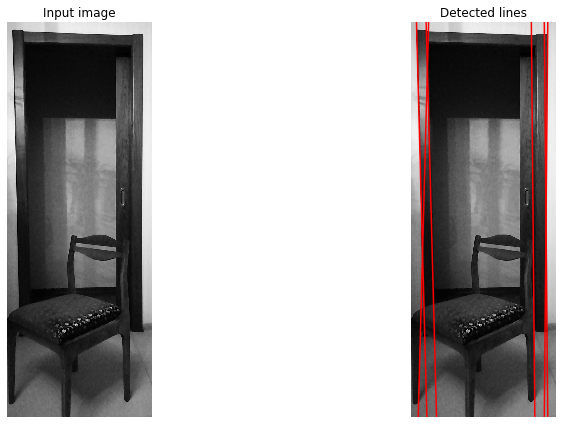

test № 1 width =  0.9066045340836393


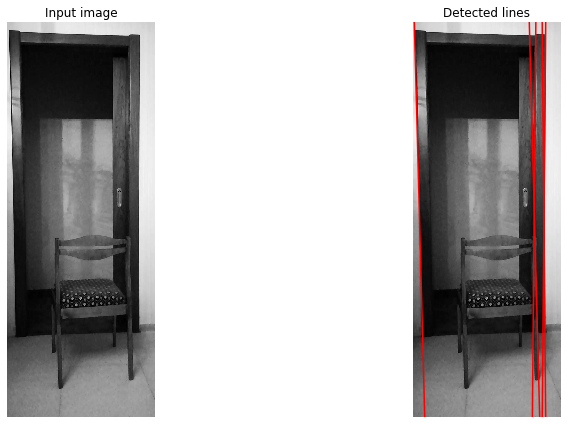

test № 2 width =  0.8901893701689462


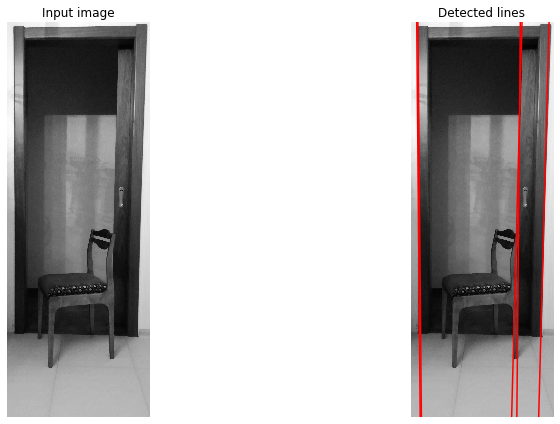

test № 3 width =  0.9274949578449978


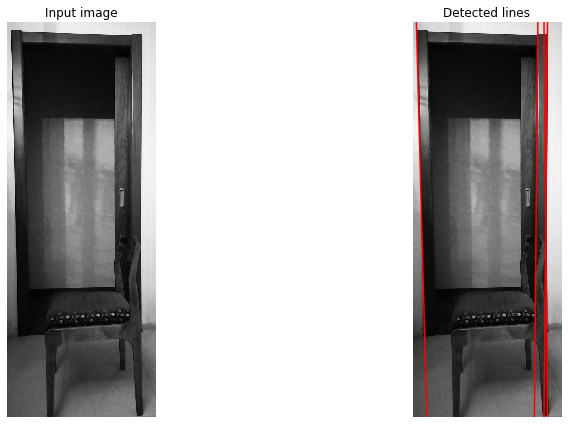

test № 4 width =  0.8850978804601295


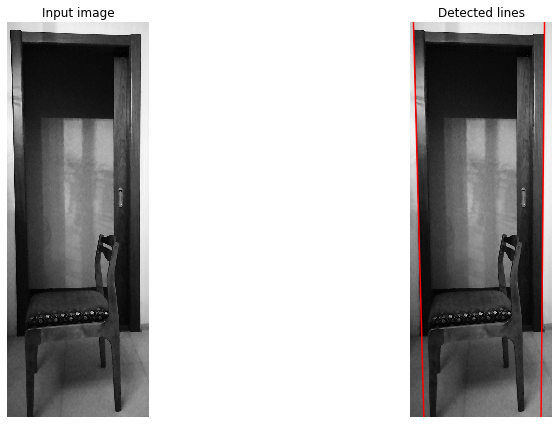

test № 5 width =  0.923525809307968


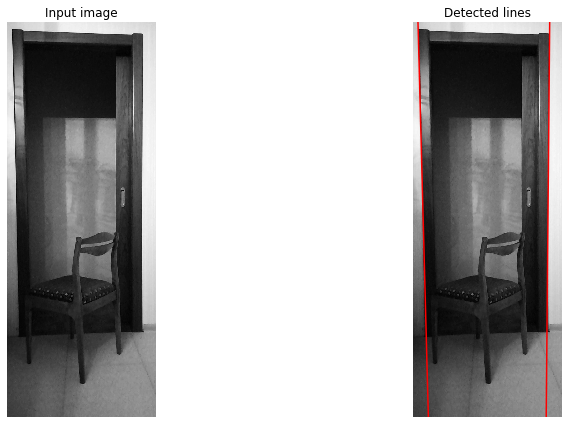

test № 6 width =  0.8843533117728588


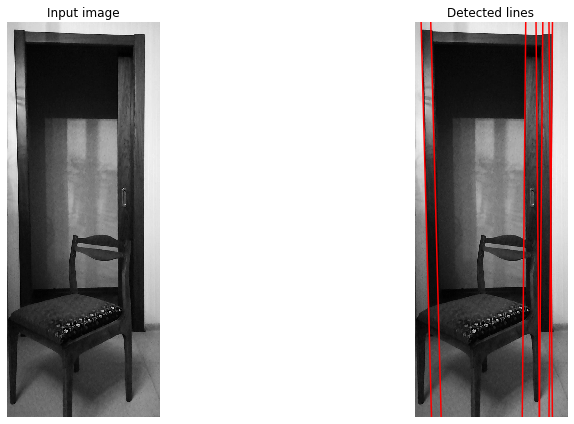

test № 7 width =  0.8613952635319473


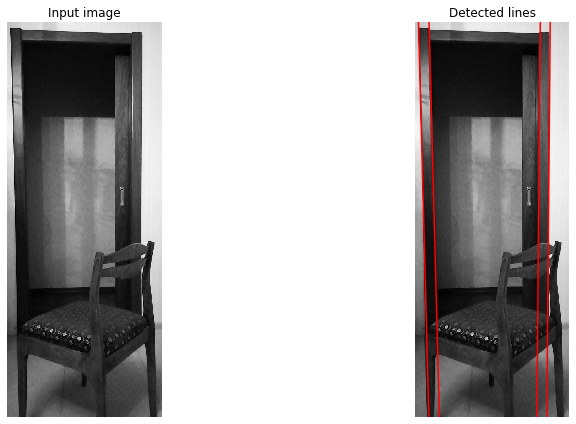

test № 8 width =  0.8554364233401519


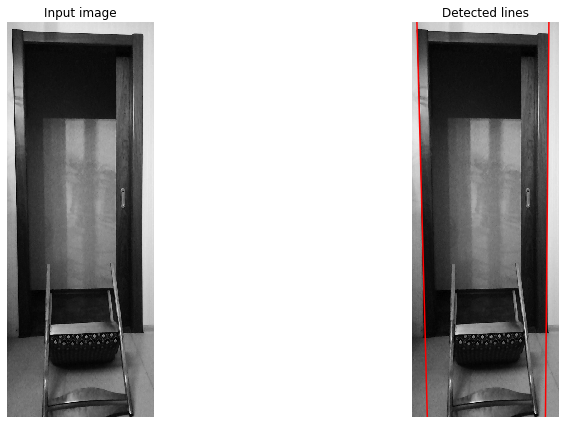

test № 9 width =  0.8989546172880903


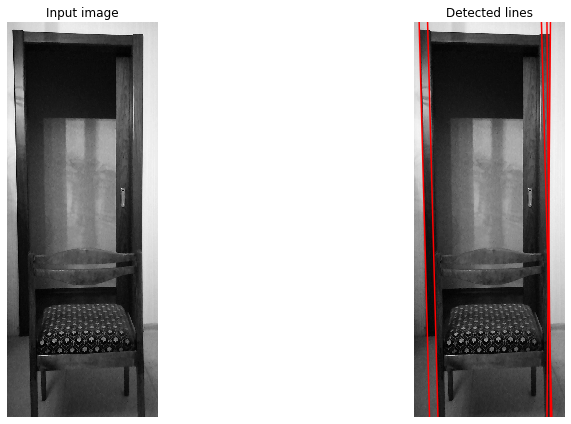

test № 10 width =  0.8707839736150171


In [16]:
from skimage.transform import (hough_line, hough_line_peaks,
                               probabilistic_hough_line)
from skimage.feature import canny

from matplotlib import cm

def find_door_width(image, output):
    x_min = image.shape[1]
    x_max = 0.0

    
    h, theta, d = hough_line(canny(image))


    if output:
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        ax[0].imshow(image, cmap=cm.gray)
        ax[0].set_title('Input image')
        ax[0].set_axis_off()
        ax[1].imshow(image, cmap=cm.gray)
        
    for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
        y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
        y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)
        if (np.abs(angle) <= 0.3):
            if x_min > dist:
                x_min = dist
            if x_max < dist:
                x_max = dist
            if output:
                ax[1].plot((0, image.shape[1]), (y0, y1), '-r')
    if output:
        ax[1].set_xlim((0, image.shape[1]))
        ax[1].set_ylim((image.shape[0], 0))
        ax[1].set_axis_off()
        ax[1].set_title('Detected lines')
        plt.tight_layout()
        plt.show()
    
    return (x_max - x_min) / image.shape[1]

sample_size = 10
for n in range(1, sample_size + 1):
    path = "data/test/yes/" + str(n) + ".jpg"
    img = rgb2gray(imread(path))
    w = find_door_width(img,output=True)
    print("test №", n, "width = ", w)


Вполне приемлемо. Этот способ будет выбран для детектирования двери.

Ширина двери высчитывается относительно ширины картинки. Берём самую левую и правую прямые, находим расстояние между ними, делим на ширину картинки.

## Тестирование итогового алгоритма

In [17]:
correct_answers = 0
sample_size_yes = 31 
for n in range(1, sample_size_yes + 1):
    path2 = "data/test/yes/" + str(n) + ".jpg"
    dst = cv2.cvtColor(cv2.imread(path2), cv2.COLOR_BGR2GRAY)
    print("test №", n, "/", sample_size_yes, "...")
    chair_w = try_all_templates(dst, output_info=False, output_graphics=False, 
                                figsize=9, threshold = 200, templates_total = 14, templates_path = "data/single_chair/")
    door_w = find_door_width(dst, output=False)
    
    answer = "yes"
    chair_w = chair_w / 1.1 # поправка на то, что стул находится ближе к камере, чем дверь
    door_w = door_w / 1.1 # поправка на то, что у двери есть плинтус
    
    if chair_w > door_w:
        answer = "no"
    
    if answer == "yes":
        correct_answers += 1
        
    print("answer: ", answer)


sample_size_no = 8
for n in range(1, sample_size_no + 1):
    path2 = "data/test/no/" + str(n) + ".jpg"
    dst = cv2.cvtColor(cv2.imread(path2), cv2.COLOR_BGR2GRAY)
    print("test №", n, "/", sample_size_no, "...")

    chair_w = try_all_templates(dst, output_info=False, output_graphics=False, 
                                figsize=9, threshold = 200, templates_total = 14, templates_path = "data/single_chair/")
    door_w = find_door_width(dst, output=False)
    
    answer = "yes"
    chair_w = chair_w / 1.1 # поправка на то, что стул находится ближе к камере, чем дверь
    door_w = door_w / 1.1 # поправка на то, что у двери есть плинтус
    
    if chair_w > door_w:
        answer = "no"
    
    if answer == "no":
        correct_answers += 1
        
    print("answer: ", answer)
    
error = correct_answers / (sample_size_no + sample_size_yes)
print("error rate = ", error)

test № 1 / 31 ...
answer:  yes
test № 2 / 31 ...
answer:  yes
test № 3 / 31 ...
answer:  yes
test № 4 / 31 ...
answer:  yes
test № 5 / 31 ...
answer:  yes
test № 6 / 31 ...
answer:  yes
test № 7 / 31 ...
answer:  no
test № 8 / 31 ...
answer:  no
test № 9 / 31 ...
answer:  yes
test № 10 / 31 ...
answer:  yes
test № 11 / 31 ...
answer:  no
test № 12 / 31 ...
answer:  yes
test № 13 / 31 ...
answer:  yes
test № 14 / 31 ...
answer:  no
test № 15 / 31 ...
answer:  yes
test № 16 / 31 ...
answer:  yes
test № 17 / 31 ...
answer:  yes
test № 18 / 31 ...
answer:  yes
test № 19 / 31 ...
answer:  yes
test № 20 / 31 ...
answer:  no
test № 21 / 31 ...
answer:  yes
test № 22 / 31 ...
answer:  yes
test № 23 / 31 ...
answer:  yes
test № 24 / 31 ...
answer:  yes
test № 25 / 31 ...
answer:  no
test № 26 / 31 ...
answer:  yes
test № 27 / 31 ...
answer:  yes
test № 28 / 31 ...
answer:  yes
test № 29 / 31 ...
answer:  yes
test № 30 / 31 ...
answer:  yes
test № 31 / 31 ...
answer:  yes
test № 1 / 8 ...
answer

Получена точность 77%